# Importações

In [1]:
import numpy as np
import cv2 as cv                             # OpenCV
import plotly.graph_objects as go            # Plotly
from plotly.subplots import make_subplots    # Subplots no Plotly
import plotly.express as px                  # Plotar imagens com o Plotly
from google.colab import output              # 2 linhas para permitir apresentar esses gráficos
output.enable_custom_widget_manager()
import random                                # Funcao para gerar numeros aleatorios
# from google.colab import drive
# drive.mount('/content/drive')
from google.colab.patches import cv2_imshow
import urllib

# Gold Standard

In [2]:
# H_matrix transforma de pts1 para pts2
def meu_DLT(pts1,pts2):

  # Adicionar a coordenada homogenea nos pontos
  pts1h = np.vstack([pts1,np.ones(pts1.shape[1])])
  pts2h = np.vstack([pts2,np.ones(pts2.shape[1])])

  # Calcula a matriz A
  A = np.zeros((2*pts1.shape[1],9))
  k = 0
  for i in range(pts1.shape[1]):
    A[k,3:6] = -pts2h[2,i]*pts1h[:,i].T #-w2i*pt1[i]
    A[k,6:9] = pts2h[1,i]*pts1h[:,i].T  #y2i*pt1[i]
    A[k+1,0:3] = pts2h[2,i]*pts1h[:,i].T #w2i*pt1[i]
    A[k+1,6:9] = -pts2h[0,i]*pts1h[:,i].T #w2i*pt1[i]
    k = k+2

  # Calcula o SVD(A) = U.S.Vt
  U,S,Vt = np.linalg.svd(A)

  # Reshape da ultima linha de Vt (ultima coluna de V) para a matriz de homografia
  h = Vt[-1,:]
  H_matrix = h.reshape(3,3)

  return H_matrix

def normaliza_pontos(pontos):

  # Calcular o centroide
  centroide = np.mean(pontos,axis=1).reshape(-1, 1)

  # Calcular a distancia media dos pontos tendo o centroide como origem
  pontos_c = pontos - centroide
  pontos_d = np.sqrt(pontos_c[0,:]**2+pontos_c[1,:]**2)
  dist_media = np.mean(pontos_d)

  # Definir a escala para ter como distancia media sqrt(2)
  escala = np.sqrt(2)/dist_media

  # Definir a matriz de normalizacao
  T = np.array([[escala, 0 , -escala*centroide[0][0]],[0, escala, -escala*centroide[1][0]], [0, 0, 1]])

  # Coordenadas homogeneas
  pontosh = np.vstack((pontos,np.ones(pontos.shape[1])))
  # Normalizacao dos pontos
  npontosh = T@pontosh

  # Reshape dos pontos para o formato original, eliminando a coordenada homogenea
  npontosh = npontosh[:-1,:]

  return T, npontosh

def minha_homografia(pts1,pts2):

  # Normaliza pontos
  T1, npts1 = normaliza_pontos(pts1)
  T2, npts2 = normaliza_pontos(pts2)

  # Execucao do DLT e obtencao da H normalizada
  Hn = meu_DLT(npts1,npts2)

  # Desnormalizacao da matriz de homografia H
  H  = np.linalg.inv(T2)@Hn@T1

  return H

# H_matrix transforma de pts1 para pts2
def gold_standard(pts1,pts2,N,T):
  if pts1.shape[1] < 4:
      return None
  n = N                 # Numero de iteracoes
  I_total = 0           # Total de inliers ate entao
  inliers = []          # Lista de inliers ate entao

  while n != 0:
    # Selecao aleatoria de 4 correspondencias para o DLT normalizado
    indices = random.sample(range(pts1.shape[1]), 4)
    pts1_s = pts1[:, indices]
    pts2_s = pts2[:, indices]

    # Execucao do DLT normalizado com essas 4 correspondencias
    H = minha_homografia(pts1_s,pts2_s)

    # Calculo da distancia (norma 2) de cada ponto H@pts1 com pts2
    pts1h = np.vstack((pts1, np.ones(pts1.shape[1])))
    pts2h = H @ pts1h
    pts2h[2, :] = np.where(pts2h[2, :] == 0, 1e-10, pts2h[2, :])
    pts2h = pts2h/pts2h[2, :]
    d = np.linalg.norm(pts2h[0:2,:]-pts2,2,0)

    # Calculo do numero de inliers para d < T
    inliers_n = d < T
    num_inliers = np.sum(inliers_n)

    # Atualizacao de I_total e inliers caso num_inliers > I_total
    if num_inliers > I_total:
      I_total = num_inliers
      inliers = inliers_n

    # Decremento de n
    n -= 1

  # Calculo de H pelo DLT normalizado utilizando todos os inliers
  H = minha_homografia(pts1[:,inliers],pts2[:,inliers])

  return H

# Pegando as imagens

In [3]:
# https://github.com/OpenStitching/stitching/blob/main/tests/testdata/TEST_IMAGES.txt
imgslink = [
            "https://raw.githubusercontent.com/lukasalexanderweber/stitching_tutorial/master/imgs/weir_1.jpg",
            "https://raw.githubusercontent.com/lukasalexanderweber/stitching_tutorial/master/imgs/weir_2.jpg",
            "https://raw.githubusercontent.com/lukasalexanderweber/stitching_tutorial/master/imgs/weir_3.jpg",
]
imgs = []
for link in imgslink:
  req = urllib.request.urlopen(link)
  arr = np.asarray(bytearray(req.read()), dtype=np.uint8)
  img = cv.imdecode(arr, -1)
  imgs.append(img)

# imgs = [
#     cv.resize(cv.imread('/content/drive/MyDrive/IMG_20250401_224607675.jpg'), (0, 0), fx = 1, fy = 1),
#     cv.resize(cv.imread('/content/drive/MyDrive/IMG_20250401_224612405.jpg'), (0, 0), fx = 1, fy = 1),
# ]



# Detector dos keypoints (SIFT)

In [4]:
def kp_detector(img1, img2, order = '1 <- 2'):
  # Utilizacao do detector SIFT
  ## Cria o objeto do detector
  sift = cv.SIFT_create()
  ## Encontra os pontos de destaque e seus descritores
  kp1, des1 = sift.detectAndCompute(img1,None)
  kp2, des2 = sift.detectAndCompute(img2,None)
  ## Utilizacao do algoritmo FLANN para descobrir as correspondencias
  FLANN_INDEX_KDTREE = 1
  index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
  search_params = dict(checks = 50)             # Numero de repeticoes internas. Maior, melhor, mais lento
  flann = cv.FlannBasedMatcher(index_params, search_params)
  ## Encontra as correspondencias (ponto 3 da img1 corresponde ao ponto 7 da img2)
  matches = flann.knnMatch(des1,des2,k=2)       # k = 2 retorna 2 possibilidades de correspondencias para cada ponto
  ## Salva apenas as correspondencias confiaveis
  good = []
  for m,n in matches:
    if m.distance < 0.75*n.distance:
      good.append(m)

  # Desenha uma imagem com as correspondencias em verde
  matchesMask = None
  draw_params = dict(matchColor=(0,255,0),singlePointColor=None,matchesMask=matchesMask,flags=2)
  matches_img = cv.drawMatches(img1,kp1,img2,kp2,good,None,**draw_params)

  if order == '1 <- 2':
    src_pts = np.float32([ kp2[m.trainIdx].pt for m in good ])
    dst_pts = np.float32([ kp1[m.queryIdx].pt for m in good ])
  else:
    src_pts = np.float32([ kp1[m.trainIdx].pt for m in good ])
    dst_pts = np.float32([ kp2[m.queryIdx].pt for m in good ])

  return src_pts, dst_pts, matches_img

# Utilizando a homografia para juntar as imagens

In [5]:
#             A <- B
def warpImagesCorrected(imgA, imgB, H):

  rows1, cols1 = imgA.shape[:2]
  rows2, cols2 = imgB.shape[:2]

  list_of_points_1 = np.float32([[0,0], [0, rows1],[cols1, rows1], [cols1, 0]]).reshape(-1, 1, 2)
  temp_points = np.float32([[0,0], [0,rows2], [cols2,rows2], [cols2,0]]).reshape(-1,1,2)

  # When we have established a homography we need to warp perspective
  # Change field of view
  list_of_points_2 = cv.perspectiveTransform(temp_points, H)

  list_of_points = np.concatenate((list_of_points_1,list_of_points_2), axis=0)

  [x_min, y_min] = np.int32(list_of_points.min(axis=0).ravel() - 0.5)
  [x_max, y_max] = np.int32(list_of_points.max(axis=0).ravel() + 0.5)

  translation_dist = [-x_min,-y_min]

  H_translation = np.array([[1, 0, translation_dist[0]], [0, 1, translation_dist[1]], [0, 0, 1]])

  warped_img = cv.warpPerspective(imgB, H_translation.dot(H), (x_max-x_min, y_max-y_min))

  output_img = warped_img.copy()
  output_img[translation_dist[1]:rows1+translation_dist[1], translation_dist[0]:cols1+translation_dist[0]] = imgA


  bit_1 = cv.threshold(cv.cvtColor(warped_img, cv.COLOR_BGR2GRAY), 0, 255, cv.THRESH_BINARY)[1]
  bit_2 = cv.threshold(cv.cvtColor(output_img, cv.COLOR_BGR2GRAY), 0, 255, cv.THRESH_BINARY)[1]

  '''
  A B - R
  0 0 - 0
  0 1 - 1
  1 0 - 0
  1 1 - 0
  R = not(A) and B
  A sendo output_img
  B sendo warped_img
  '''

  bit_2 = cv.bitwise_not(bit_2)
  bit = cv.bitwise_and(bit_1, bit_2)
  fill_img = cv.bitwise_and(warped_img, warped_img, mask = bit)

  '''
  A B - R
  0 0 - 0
  0 1 - 1
  1 0 - 1
  1 1 - X
  A or B
  A sendo output_img
  B sendo fill_img
  '''

  output_img = cv.bitwise_or(output_img, fill_img)

  return output_img

  #             A <- B
def warpImages(imgA, imgB, H):

  rows1, cols1 = imgA.shape[:2]
  rows2, cols2 = imgB.shape[:2]

  list_of_points_1 = np.float32([[0,0], [0, rows1],[cols1, rows1], [cols1, 0]]).reshape(-1, 1, 2)
  temp_points = np.float32([[0,0], [0,rows2], [cols2,rows2], [cols2,0]]).reshape(-1,1,2)

  # When we have established a homography we need to warp perspective
  # Change field of view
  list_of_points_2 = cv.perspectiveTransform(temp_points, H)

  list_of_points = np.concatenate((list_of_points_1,list_of_points_2), axis=0)

  [x_min, y_min] = np.int32(list_of_points.min(axis=0).ravel() - 0.5)
  [x_max, y_max] = np.int32(list_of_points.max(axis=0).ravel() + 0.5)

  translation_dist = [-x_min,-y_min]

  H_translation = np.array([[1, 0, translation_dist[0]], [0, 1, translation_dist[1]], [0, 0, 1]])

  warped_img = cv.warpPerspective(imgB, H_translation.dot(H), (x_max-x_min, y_max-y_min))

  output_img = warped_img.copy()
  output_img[translation_dist[1]:rows1+translation_dist[1], translation_dist[0]:cols1+translation_dist[0]] = imgA

  return output_img

# Final

In [6]:
mosaic_corrected = [imgs[0]]
mosaic = [imgs[0]]
matches_imgs = []

for i in range(len(imgs)-1):
  src_pts, dst_pts, matches = kp_detector(mosaic[i], imgs[i+1], '1 <- 2')

  H = gold_standard(src_pts.T, dst_pts.T, 200, 20)
  if H is None:
    print("H is None")
    continue
  mosaic.append(warpImages(mosaic[i], imgs[i+1], H))
  mosaic_corrected.append(warpImagesCorrected(mosaic_corrected[i], imgs[i+1], H))
  matches_imgs.append(matches)



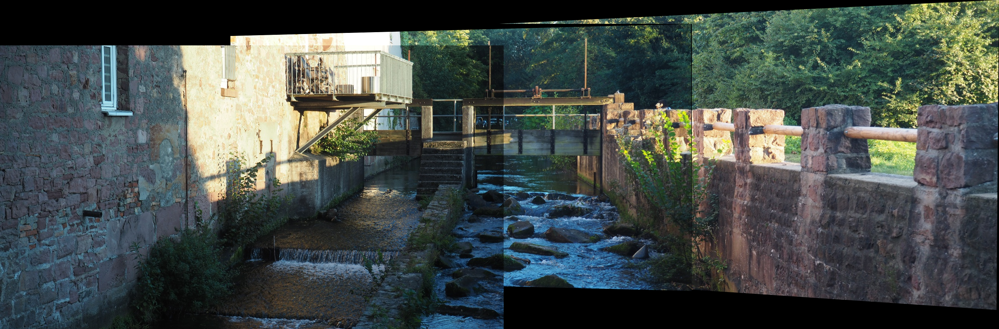

In [7]:
# Erro ao juntar imagem distorcida com nova imagem
cv2_imshow(mosaic[2])

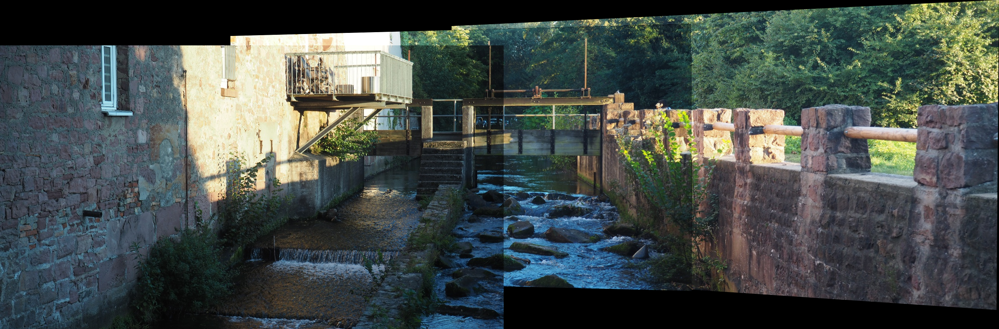

In [8]:
# Corrigido
cv2_imshow(mosaic_corrected[2])